In [1]:
import pandas as pd

data = pd.read_csv('C://Offline_Storage//allTitles.csv')

In [2]:
data['organizationalPerson.title'] = data['organizationalPerson.title'].str.lower().str.replace('[^a-z\s]', '')

In [7]:
from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(data['organizationalPerson.title'], test_size=0.2)

In [8]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1,2), max_df=0.85, min_df=0.01)
X_train_vec = vectorizer.fit_transform(X_train)

In [51]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

data['organizationalPerson.title'].fillna("", inplace=True)

# Using the entire data's vector representation
tfidf_all = vectorizer.transform(data['organizationalPerson.title'])

# Clustering
kmeans = KMeans(n_clusters=5, n_init='auto', random_state=0).fit(tfidf_all)

# Create a dataframe to hold the t-SNE results and clusters
result_df = pd.DataFrame()

# Applying t-SNE
from sklearn.manifold import TSNE
tsne3 = TSNE(n_components=3, random_state=0)
result_df[['X', 'Y', 'Z']] = pd.DataFrame(tsne3.fit_transform(tfidf_all.toarray()))

# Add cluster labels to dataframe
result_df['cluster'] = kmeans.labels_

# Add original titles to dataframe
result_df['title'] = data['organizationalPerson.title']

# From here, you can proceed with outlier detection and filtering.
# After filtering, you'll be ready to visualize with Plotly, and the titles will already be in your dataframe.

In [52]:
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)

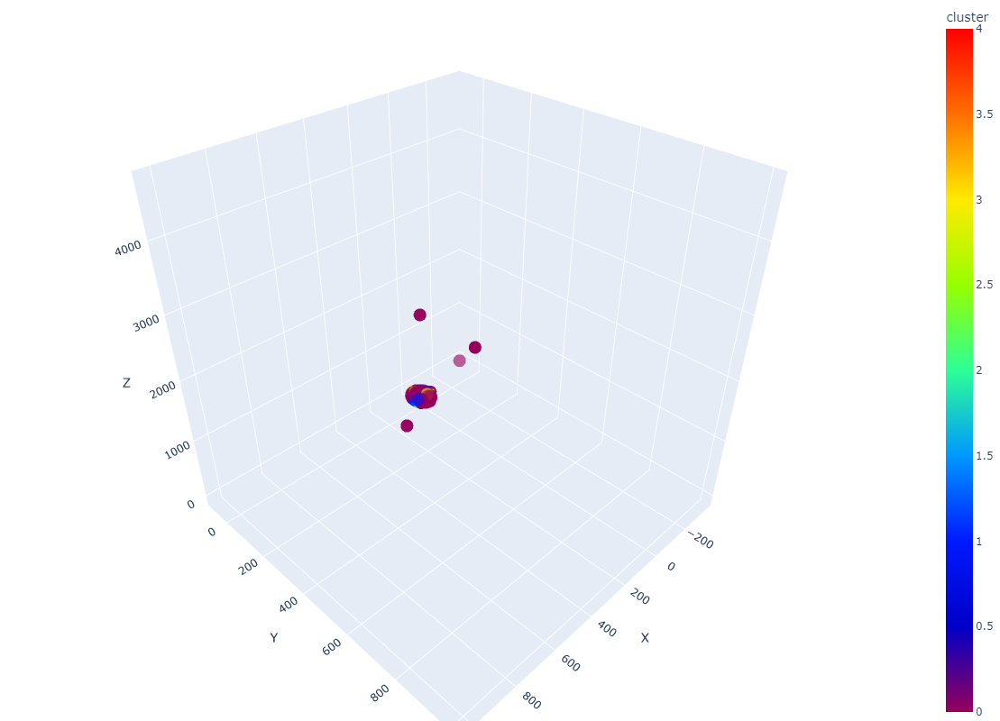

In [53]:
import plotly.express as px

# Using the result_df directly for visualization
fig = px.scatter_3d(result_df, x='X', y='Y', z='Z', color='cluster',
                    color_continuous_scale='rainbow', opacity=0.6,
                    hover_data=['title'])  # Using titles from result_df for hover data

# You can adjust the layout or appearance if needed
fig.update_layout(margin=dict(t=0, b=0, l=0, r=0))

fig.update_layout(width=1000, height=800)
fig.show()

In [22]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

data['organizationalPerson.title'].fillna("", inplace=True)

# Using the entire data's vector representation
tfidf_all = vectorizer.transform(data['organizationalPerson.title'])

# Clustering
kmeans = KMeans(n_clusters=5, n_init='auto', random_state=0).fit(tfidf_all)

# Getting cluster assignments for each title
data['Cluster'] = kmeans.labels_

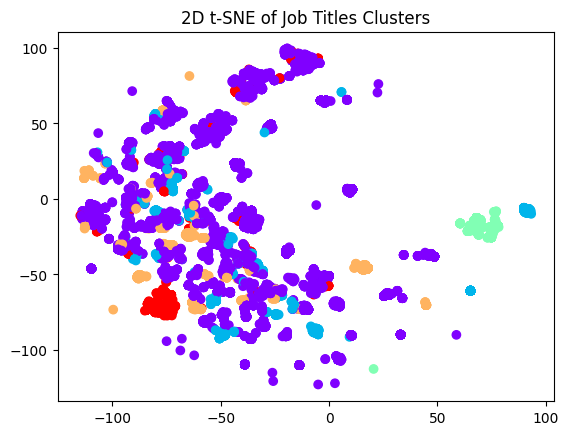

In [23]:
from sklearn.manifold import TSNE

# Reducing dimensionality for visualization
tsne = TSNE(n_components=2, random_state=0)
transformed_data = tsne.fit_transform(tfidf_all.toarray())

plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=kmeans.labels_, cmap='rainbow')
plt.title('2D t-SNE of Job Titles Clusters')
plt.show()

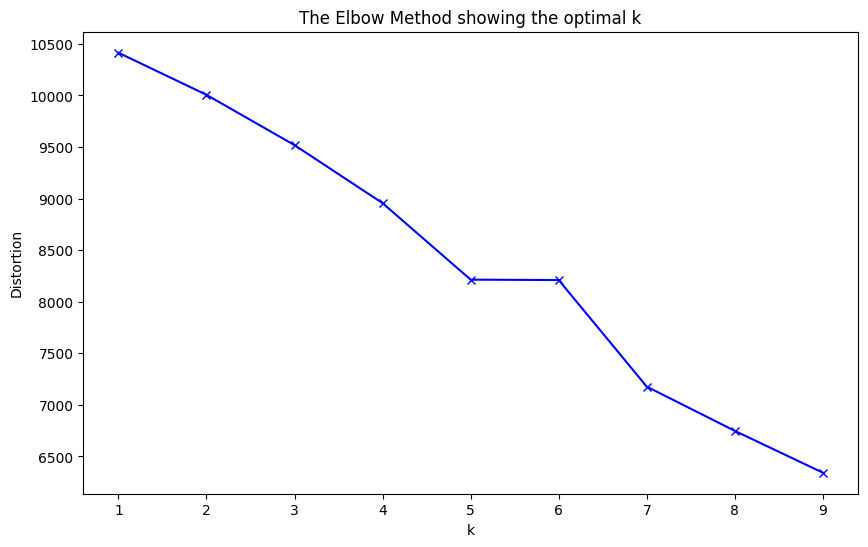

In [12]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, n_init='auto')
    kmeanModel.fit(tfidf_all)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(10,6))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

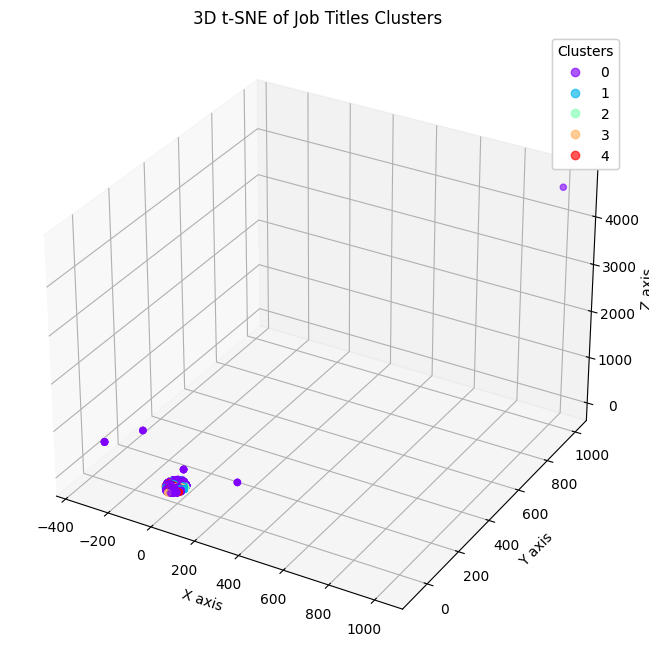

In [25]:
from mpl_toolkits.mplot3d import Axes3D

tsne3 = TSNE(n_components=3, random_state=0)
transformed_data_3d = tsne3.fit_transform(tfidf_all.toarray())

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    transformed_data_3d[:, 0], 
    transformed_data_3d[:, 1], 
    transformed_data_3d[:, 2], 
    c=kmeans.labels_, 
    cmap='rainbow', 
    s=20, # size of points
    alpha=0.6 # transparency
)

ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
ax.set_title('3D t-SNE of Job Titles Clusters')

# Optional: Legend
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

plt.show()


In [29]:
import numpy as np

def find_outliers(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    outlier_step = 1.5 * IQR
    outliers_index = np.where((data < Q1 - outlier_step) | (data > Q3 + outlier_step))
    return outliers_index

outliers = find_outliers(transformed_data_3d)

In [35]:
print(transformed_data_3d.shape)

(22775, 3)


In [36]:
distances = np.sqrt((transformed_data_3d**2).sum(axis=1))
outliers_threshold = np.percentile(distances, 95)  # We can adjust this as required
outlier_indices = np.where(distances > outliers_threshold)

In [37]:
print(transformed_data_3d[outlier_indices].shape)
print(len(outlier_indices[0]))

(1124, 3)
1124


In [38]:
outlier_data = transformed_data_3d[outlier_indices]
outlier_df = pd.DataFrame(outlier_data, columns=["X", "Y", "Z"])
print(outlier_df.head())  # display the top rows of the outlier dataframe

           X          Y          Z
0   9.997735 -35.601536 -21.071545
1   4.449788 -22.900343 -35.360981
2   9.997735 -35.601536 -21.071545
3 -41.244389   3.072113  -4.844849
4 -13.699553  32.972683 -21.039726


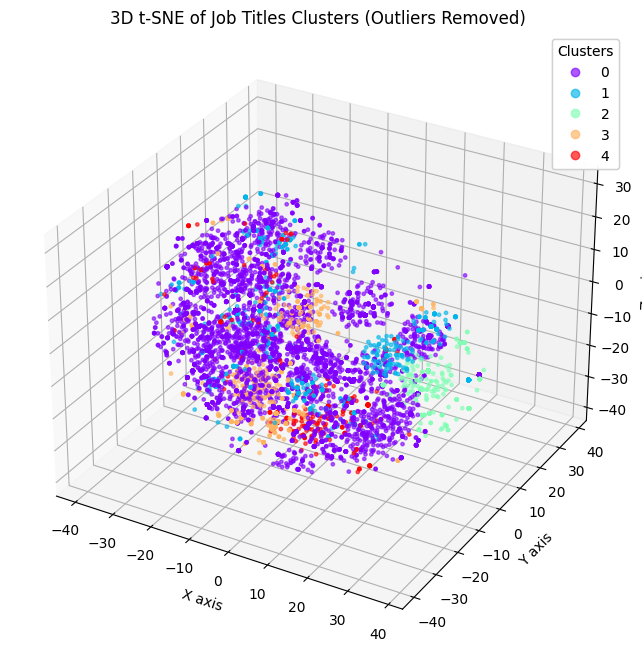

In [43]:
# Convert tuple of indices to a boolean mask
outlier_mask = np.zeros(transformed_data_3d.shape[0], dtype=bool)
outlier_mask[np.array(outlier_indices)] = True

# Create a mask for non-outliers
non_outlier_mask = ~outlier_mask

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Filter out the outlier indices for plotting
non_outliers_data = transformed_data_3d[non_outlier_mask]
non_outliers_labels = kmeans.labels_[non_outlier_mask]

scatter = ax.scatter(
    non_outliers_data[:, 0], 
    non_outliers_data[:, 1], 
    non_outliers_data[:, 2], 
    c=non_outliers_labels, 
    cmap='rainbow', 
    s=6,  # size of points
    alpha=0.6  # transparency
)

ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
ax.set_title('3D t-SNE of Job Titles Clusters (Outliers Removed)')

# Optional: Legend
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

plt.show()

In [46]:
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)

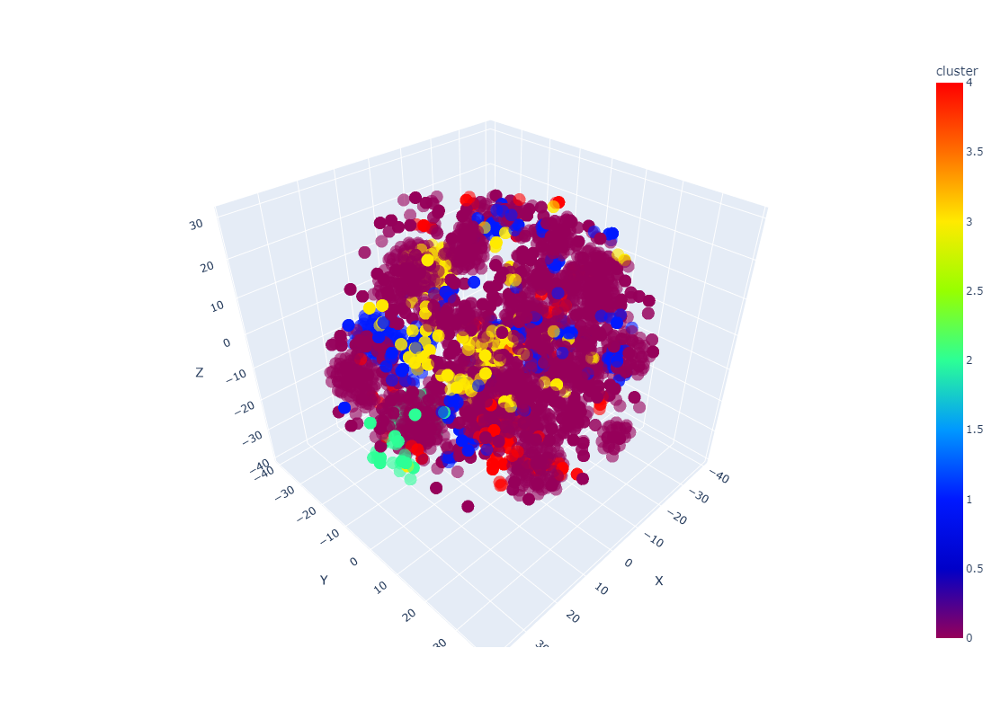

In [47]:
import plotly.express as px

# Create a DataFrame for easier handling
df_3d = pd.DataFrame(non_outliers_data, columns=['X', 'Y', 'Z'])
df_3d['cluster'] = non_outliers_labels

fig = px.scatter_3d(df_3d, x='X', y='Y', z='Z', color='cluster', 
                    color_continuous_scale='rainbow', opacity=0.6)

fig.update_layout(width=1000, height=800)
fig.show()

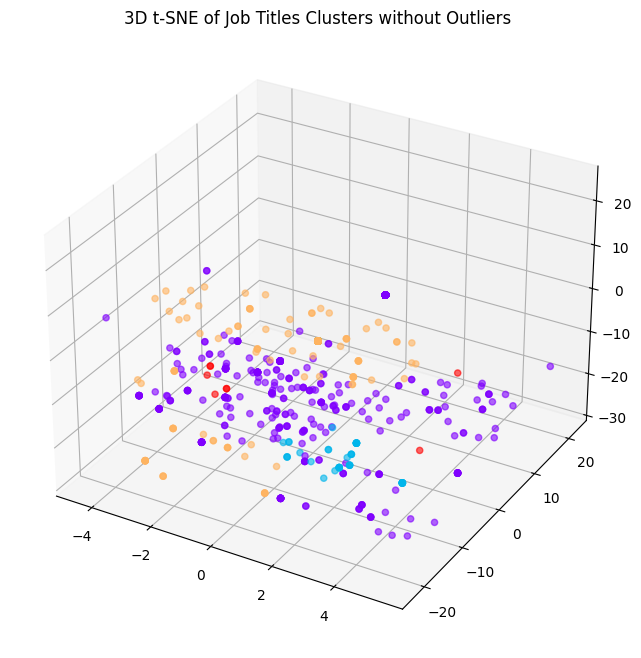

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the outlier identification function
def find_outliers(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    outlier_step = 1.5 * IQR
    outliers_mask = (data < Q1 - outlier_step) | (data > Q3 + outlier_step)
    return outliers_mask

# Convert data to a numpy array for processing
data_array = result_df[['X', 'Y', 'Z']].values

# Identify outliers for each dimension and combine
outliers_x = find_outliers(data_array[:, 0])
outliers_y = find_outliers(data_array[:, 1])
outliers_z = find_outliers(data_array[:, 2])
combined_outliers_mask = outliers_x | outliers_y | outliers_z

# Create non-outlier mask
non_outlier_mask = ~combined_outliers_mask

# Filter the dataframe
filtered_df = result_df[non_outlier_mask]

# Visualization (optional)
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(filtered_df['X'], filtered_df['Y'], filtered_df['Z'], c=filtered_df['cluster'], cmap='rainbow', s=20, alpha=0.6)
ax.set_title('3D t-SNE of Job Titles Clusters without Outliers')
plt.show()


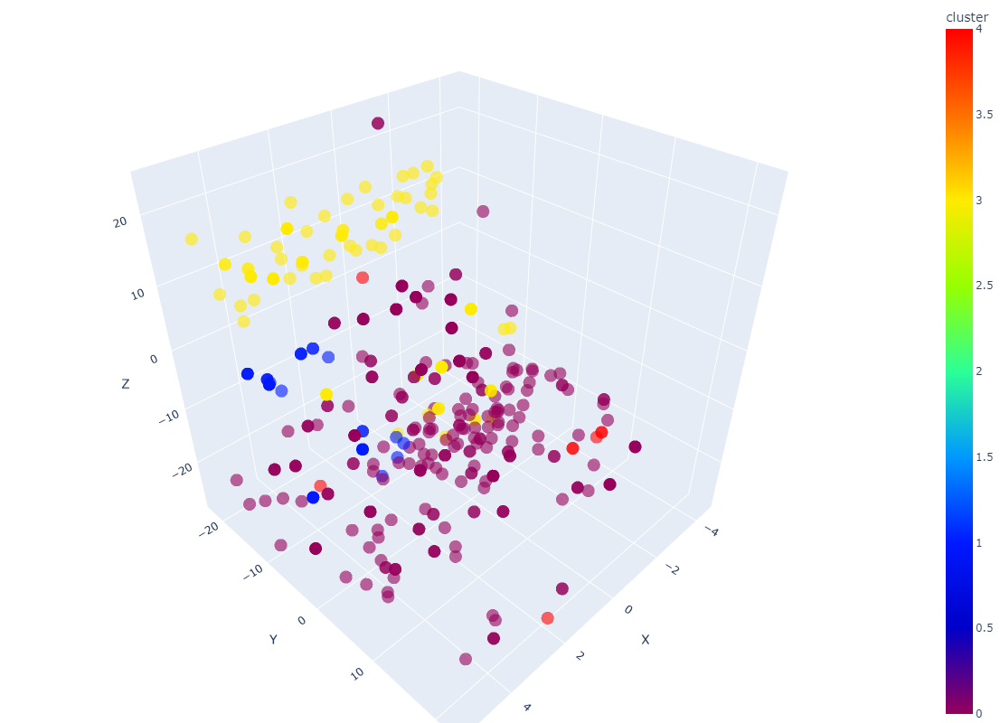

In [58]:

# NEED TO FILTER OUTLIERS AND RUN AGAIN WITH LABELS
# df_outliers = find_outliers(result_df)


# Using the result_df directly for visualization
fig = px.scatter_3d(filtered_df, x='X', y='Y', z='Z', color='cluster',
                    color_continuous_scale='rainbow', opacity=0.6,
                    hover_data=['title'])  # Using titles from result_df for hover data

# You can adjust the layout or appearance if needed
fig.update_layout(margin=dict(t=0, b=0, l=0, r=0))

fig.update_layout(width=1000, height=800)
fig.show()

### Split and Label a sub-set of the data:

In [11]:
labeled_data = data.sample(n=2000)

In [52]:
# labeled_data.to_csv('C://Offline_Storage//sampled_titles.csv', index=False) # commented out to prevent re-sampling

In [53]:
#Read in the labeled sample
labeled_data = pd.read_csv('C://Offline_Storage//sampled_titles.csv')

### Split Data for Training and Testing

In [54]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(labeled_data['organizationalPerson.title'], labeled_data['label'], test_size=0.2)

In [55]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1,2), max_df=0.85, min_df=0.01)
X_train_vec = vectorizer.fit_transform(X_train)
X_val_vec = vectorizer.transform(X_val)

In [56]:
from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression(max_iter=1000)
classifier.fit(X_train_vec, y_train)

LogisticRegression(max_iter=1000)

In [57]:
y_pred = classifier.predict(X_val_vec)

In [58]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

print("Accuracy:", accuracy_score(y_val, y_pred))
print("Precision:", precision_score(y_val, y_pred))
print("Recall:", recall_score(y_val, y_pred))

Accuracy: 0.9475
Precision: 0.8596491228070176
Recall: 0.7903225806451613


### Predictions Preview:

In [41]:
results_df = pd.DataFrame({
    'Job Title': X_val,
    'Actual Label': y_val,
    'Predicted Label': y_pred
})

In [42]:
print("Manager Predictions Preview:")
display(results_df[results_df['Predicted Label'] == 1].head(10))
display(results_df[results_df['Predicted Label'] == 1].tail(10))

Manager Predictions Preview:


,Job Title,Actual Label,Predicted Label
1681,"senior vice president, product management, dig...",1,1
733,national sales mgr - ddc,1,1
1817,sr marketing insights manager,0,1
330,director public affairs,1,1
1806,"sr manager, operations management",1,1
1756,sr director technical development,1,1
1863,sr. manager experiential marketing,1,1
352,"director, franchise management",1,1
1738,sr director - human resources,1,1
637,leadership development director,0,1


,Job Title,Actual Label,Predicted Label
1520,president evernorth pharmacy businesses,1,1
1830,sr mgr stakeholder engagement,1,1
1760,"sr director, workforce analytics",1,1
1851,sr strategic partnerships mgr,1,1
1676,"senior vice president, m&a integration and min...",1,1
1807,"sr manager, pmo",1,1
1940,"vice president, business analysis",1,1
1777,sr manager - product mgmt,1,1
1804,"sr manager, direct sales new business - cai",1,1
1973,vp retail compliance,1,1


In [44]:
print("Non-Management Role Predictions Preview:")
display(results_df[results_df['Predicted Label'] == 0].head(10))
display(results_df[results_df['Predicted Label'] == 0].tail(10))

Non-Management Role Predictions Preview:


,Job Title,Actual Label,Predicted Label
1411,owner brookestevenr.(stl) (ritm2111431),0,0
1020,"o: howard, tiffany (tcjack); b: reynolds, chan...",0,0
1109,"o: matucheski, jeanne (c41560); b: broda, patr...",0,0
958,"o: gaffney, beth ann (bagaff); b: dave, shashw...",0,0
67,æ±Ÿè‹åˆ†å…¬å¸å¸‚åœºç£è®­éƒ¨æ€»ç»ç†,0,0
1021,"o: howard, tiffany (tcjack); b: young, amie (c...",0,0
1262,"o: smith, megan (c36864); b: cuddy, christophe...",0,0
888,"o: davis, josh (c70130); b: fowler, rachel (c2...",0,0
1501,package control tech,0,0
306,dir inventory mgmt operations,1,0


,Job Title,Actual Label,Predicted Label
1444,"owner: block, matthew (ritm5029914)",0,0
271,customer service manager,0,0
772,"o: barnhart, carol (c06507)",0,0
944,"o: feliciano, will (n50226); b: zuckerman, kar...",0,0
408,eligibility advisor,0,0
95,assets protection investigator,0,0
1473,"owners: haug, belinda (ehq) - contr",0,0
795,"o: blum, carla (b86565); b: savage, dorothy (c...",0,0
247,contractor - digital imager-entry,0,0
1560,proposal support senior advisor,0,0
